<a href="https://colab.research.google.com/github/sayakgis/Forest_fire/blob/master/Antwork_Exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploration of Customer Review


In [0]:
#import packages
import numpy as np
import pandas as pd
from pandas.io.json import json_normalize
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()

%matplotlib inline

In [2]:
!wget --header="Host: storage.googleapis.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/72.0.3626.121 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8" --header="Accept-Language: en-GB,en-US;q=0.9,en;q=0.8" --header="Referer: https://www.kaggle.com/" "https://storage.googleapis.com/kaggle-datasets/135520/321784/antworks_assignment.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1552472482&Signature=DYNJYWqdEdiiTR65YLFqWMmPtzsp6FzDPVKM9kqP5zI0wr1Q06HMu87S8dmio8dG8gjye2ZzgOhOVXA0YAsALBPEnHkGiHytKEQoPn4vBrecLfXLzVDo8fy2c2%2BgIJ3IAkqEpTRYhXd9MmxXp3e3qkwTnvzRyRq4Gs028A8yJekAtZT6tG3MuYH7zskR2YF5EgEiacXHVC3QL%2F9PBwXBh9HxQc5W8TOUspeaEg1QqhKnWvsXow6OAqHstMjEGr3gn0FaR96aeEcWUjcpvv5mddXrlFX%2F7ND%2FVKfHovqwPruj%2Fw%2FFSbD4tP7bJuZC%2BqUq6EYXJVoO4zSuDHdcsCFaXw%3D%3D" -O "antworks_assignment.zip" -c

--2019-03-10 14:24:13--  https://storage.googleapis.com/kaggle-datasets/135520/321784/antworks_assignment.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1552472482&Signature=DYNJYWqdEdiiTR65YLFqWMmPtzsp6FzDPVKM9kqP5zI0wr1Q06HMu87S8dmio8dG8gjye2ZzgOhOVXA0YAsALBPEnHkGiHytKEQoPn4vBrecLfXLzVDo8fy2c2%2BgIJ3IAkqEpTRYhXd9MmxXp3e3qkwTnvzRyRq4Gs028A8yJekAtZT6tG3MuYH7zskR2YF5EgEiacXHVC3QL%2F9PBwXBh9HxQc5W8TOUspeaEg1QqhKnWvsXow6OAqHstMjEGr3gn0FaR96aeEcWUjcpvv5mddXrlFX%2F7ND%2FVKfHovqwPruj%2Fw%2FFSbD4tP7bJuZC%2BqUq6EYXJVoO4zSuDHdcsCFaXw%3D%3D
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.203.128, 2404:6800:4008:c03::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.203.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12219097 (12M) [application/x-zip-compressed]
Saving to: ‘antworks_assignment.zip’

antworks_assignment 100%[===================>]  11.65M  40.7MB/s    in 0.3s    

2019-03-10 14:24:13 

In [3]:
!unzip antworks_assignment.zip

Archive:  antworks_assignment.zip
   creating: antworks_assignment/
  inflating: antworks_assignment/sample_submission.csv  
  inflating: antworks_assignment/test.csv  
  inflating: antworks_assignment/train.csv  


In [4]:
!ls 

antworks_assignment  antworks_assignment.zip  sample_data


In [0]:
#load the data
train=pd.read_csv('antworks_assignment/train.csv',sep='~')
test=pd.read_csv('antworks_assignment/test.csv',sep='~')

In [6]:
#Check the data shape
train.shape,test.shape

((30172, 5), (8760, 4))

In [7]:
train.head()

,User_ID,Description,Browser_Used,Device_Used,Is_Response
0,11755,After reading mixed reviews I almost didn't bo...,Google Chrome,Desktop,Good
1,33912,This motor inn is located about - city blocks ...,Firefox,Tablet,Good
2,10143,It was our first time there and surely not our...,Google Chrome,Mobile,Good
3,33114,"Great hotel in an excellent location, just off...",Mozilla,Desktop,Good
4,17464,We stayed at the hotel for - weeks to get away...,Google Chrome,Desktop,Good


In [8]:
test.head()

,User_ID,Description,Browser_Used,Device_Used
0,9602,A friend and I stayed in this hotel when we we...,Edge,Desktop
1,8749,I enjoy staying here when I have early flights...,Google Chrome,Mobile
2,15500,I stopped off in Seattle during a train tour o...,Chrome,Mobile
3,5495,I have stayed at this hotel - or - times now f...,Mozilla Firefox,Desktop
4,18570,Excellent location with hop on hop off city tr...,Edge,Mobile


In [9]:
#make the headers in small case for easy recall going forward
lower=[]
for i in range(0,5):
    lower.append(train.columns.tolist()[i].lower())
#print(lower)
train.columns=lower
test.columns=lower[:-1]
print('train header:',train.columns,'\ntest header:',test.columns)

train header: Index(['user_id', 'description', 'browser_used', 'device_used', 'is_response'], dtype='object') 
test header: Index(['user_id', 'description', 'browser_used', 'device_used'], dtype='object')


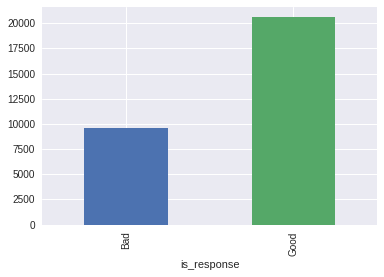

In [10]:
#Check the class count
train.groupby('is_response').count()['user_id'].plot(kind='bar')

In [11]:
# is there any relation between browser,device used and response?
pd.crosstab(index=train.is_response,columns=[train.browser_used])

browser_used,Chrome,Edge,Firefox,Google Chrome,IE,Internet Explorer,InternetExplorer,Mozilla,Mozilla Firefox,Opera,Safari
is_response,,,,,,,,,,,
Bad,273,3030,2881,482,275,182,492,945,870,92,83
Good,1608,2500,2873,3115,1645,1453,3046,1452,2470,182,223


In [12]:
pd.crosstab(index=train.is_response,columns=[train.device_used])

device_used,Desktop,Mobile,Tablet
is_response,,,
Bad,3417,3418,2770
Good,8213,8221,4133


In [15]:
# In browser_used there are many duplicate names line IE and Internet Explorer is same. lets clean that.

print(train.groupby('browser_used').count().index)

def clean_browser(string):
    string=string.replace('Google Chrome','Chrome')
    string=string.replace('Mozilla Firefox','Mozilla').replace('Firefox','Mozilla')
    string=string.replace('Internet Explorer','IE').replace('InternetExplorer','IE')
    return string
 

train['browser_used']=train.browser_used.apply(clean_browser)
test['browser_used']=test.browser_used.apply(clean_browser)
 

Index(['Chrome', 'Edge', 'IE', 'Mozilla', 'Opera', 'Safari'], dtype='object', name='browser_used')


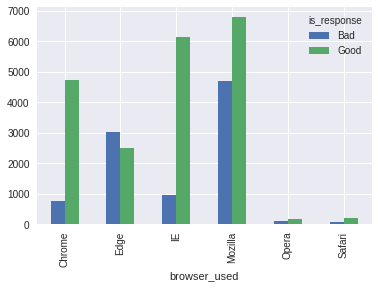

In [16]:
# is there any relation between browser,device used and response? Lets try again
pd.crosstab(index=train.is_response,columns=[train.browser_used]).T.plot(kind='bar')

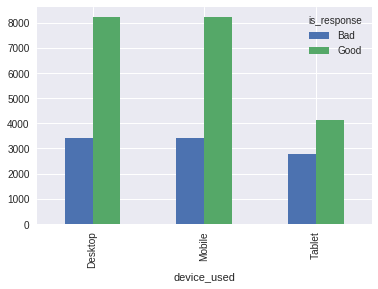

In [17]:
pd.crosstab(index=train.is_response,columns=[train.device_used]).T.plot(kind='bar')

### Clean the text field

In [18]:
# function to clean text
'''
import re
def clean_str(string1):
    string1=re.sub('\r\n',' ',string1).lower()       # replace\n
    string1=re.sub(r'[^A-Za-z]'," ",string1)     # Keep alpha characters only, special and numeric ignored
    words = string1.strip().lower().split()      # split the sentence to word
    words = [w for w in words if len(w)>=1]      # keep greater than one character words
    return " ".join(words)                       # joins them to form sentence
    #return string1
train['description']=train.description.apply(clean_str)
test['description']=test.description.apply(clean_str)
'''
print()

### Word Cloud

In [19]:
train.description[5],train.is_response[5]

('Myself and two girlfriends were in NYC for - night for both business and fun! We impressed right off the bat with the customer service. Our rooms were quaint and clean, and hotel location was great! We had one night where a fuse was broken in our room and the gentelman, Ernest, who came to fix it was so helpful and nice! He fixed the problem right away and was extremely helpful to us when we asked for some advice. He helped us out with dinner plans and we loved the restaurant!! Would definitely stay there again!!',
 'Good')

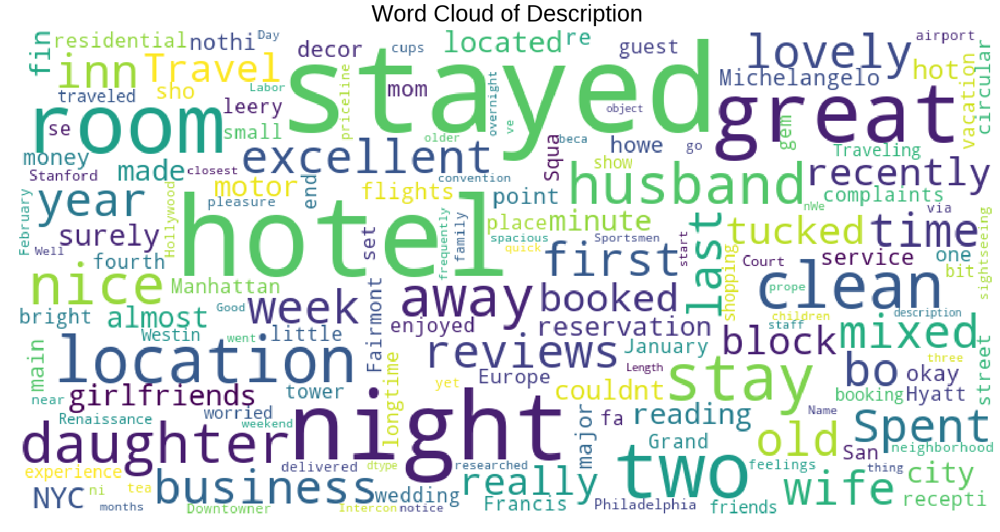

In [20]:
from wordcloud import WordCloud, STOPWORDS

def plot_wordcloud(text, mask=None, max_words=200, max_font_size=100, figure_size=(24.0,16.0), 
                   title = None, title_size=40, image_color=False):
    stopwords = set(STOPWORDS)
    more_stopwords = {'tr', 'la', 'ho', 'll', 'fac', 'chi','ha','dc','t','s'}
    stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(background_color='white',
                    stopwords = stopwords,
                    max_words = max_words,
                    max_font_size = max_font_size, 
                    random_state = 42,
                    width=800, 
                    height=400,
                    mask = mask,)
    wordcloud.generate(str(text))
    
    plt.figure(figsize=figure_size)
    if image_color:
        image_colors = ImageColorGenerator(mask);
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear");
        plt.title(title, fontdict={'size': title_size,  
                                  'verticalalignment': 'bottom'})
    else:
        plt.imshow(wordcloud);
        plt.title(title, fontdict={'size': title_size, 'color': 'black', 
                                  'verticalalignment': 'bottom'})
    plt.axis('off');
    plt.tight_layout()  
    
plot_wordcloud(train["description"], title="Word Cloud of Description")

#### There seems to be lot of variety of words, lets see word related to good and bad review

In [21]:
from plotly import tools
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go

In [0]:
# function to clean text
import re
def clean_str(string1):
    string1=re.sub('\r\n',' ',string1).lower()       # replace\n
    string1=re.sub(r'[^A-Za-z]'," ",string1)     # Keep alpha characters only, special and numeric ignored
    words = string1.strip().lower().split()      # split the sentence to word
    words = [w for w in words if len(w)>=1]      # keep greater than one character words
    return " ".join(words)                       # joins them to form sentence
    #return string1
#train['description']=train.description.apply(clean_str)
#test['description']=test.description.apply(clean_str)


In [0]:
#Function to enable plotly in colab
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [24]:
# enable output cell
from plotly.offline import iplot
import plotly.graph_objs as go

enable_plotly_in_cell()

from collections import defaultdict
train1 = train[train["is_response"]=='Bad']
train0 = train[train["is_response"]=='Good']

#clean punctutions before plot
train1["description"]=train1.description.apply(clean_str)
train0["description"]=train0.description.apply(clean_str)

## custom function for ngram generation ##
def generate_ngrams(text, n_gram=1):
    stopwords = set(STOPWORDS)
    more_stopwords = {'tr', 'la', 'ho', 'll', 'fac', 'chi','ha','dc','t','s'}
    stopwords = stopwords.union(more_stopwords)
    token = [token for token in text.lower().split(" ") if token != "" if token not in stopwords]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

## Get the bar chart from Good response ##
freq_dict = defaultdict(int)
for sent in train0["description"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(50), 'blue')

## Get the bar chart from Bad response ##
freq_dict = defaultdict(int)
for sent in train1["description"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(50), 'blue')

# Creating two subplots
fig = tools.make_subplots(rows=1, cols=2, vertical_spacing=0.04,
                          subplot_titles=["Frequent words of Good response", 
                                          "Frequent words of Bad response"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
py.iplot(fig, filename='word-plots')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



### Bigram plot

In [25]:
enable_plotly_in_cell()

freq_dict = defaultdict(int)
for sent in train0["description"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(50), 'orange')


freq_dict = defaultdict(int)
for sent in train1["description"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(50), 'orange')

# Creating two subplots
fig = tools.make_subplots(rows=1, cols=2, vertical_spacing=0.04,horizontal_spacing=0.15,
                          subplot_titles=["Frequent bigrams of Good Response", 
                                          "Frequent bigrams of Bad Response"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Bigram Count Plots")
py.iplot(fig, filename='word-plots')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



### Trigram plot

In [26]:
enable_plotly_in_cell()

freq_dict = defaultdict(int)
for sent in train0["description"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(50), 'green')


freq_dict = defaultdict(int)
for sent in train1["description"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(50), 'green')

# Creating two subplots
fig = tools.make_subplots(rows=1, cols=2, vertical_spacing=0.04,horizontal_spacing=0.15,
                          subplot_titles=["Frequent trigrams of Good Response", 
                                          "Frequent trigrams of Bad Response"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Trigram Count Plots")
py.iplot(fig, filename='word-plots')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



### Meta Features:

Now let us create some meta features and then look at how they are distributed between the classes. The ones that we will create are

Number of words in the text

Number of unique words in the text

Number of characters in the text

Number of stopwords

Number of punctuations

Number of upper case words

Number of title case words

Average length of the words

In [0]:
## Number of words in the text ##
import string
import warnings
warnings.filterwarnings("ignore")
train["num_words"] = train["description"].apply(lambda x: len(str(x).split()))
test["num_words"] = test["description"].apply(lambda x: len(str(x).split()))

## Number of unique words in the text ##
train["num_unique_words"] = train["description"].apply(lambda x: len(set(str(x).split())))
test["num_unique_words"] = test["description"].apply(lambda x: len(set(str(x).split())))

## Number of characters in the text ##
train["num_chars"] = train["description"].apply(lambda x: len(str(x)))
test["num_chars"] = test["description"].apply(lambda x: len(str(x)))

## Number of stopwords in the text ##
train["num_stopwords"] = train["description"].apply(lambda x: len([w for w in str(x).lower().split() if w in STOPWORDS]))
test["num_stopwords"] = test["description"].apply(lambda x: len([w for w in str(x).lower().split() if w in STOPWORDS]))

## Number of punctuations in the text ##
train["num_punctuations"] =train['description'].apply(lambda x: len([c for c in str(x) if c in string.punctuation]) )
test["num_punctuations"] =test['description'].apply(lambda x: len([c for c in str(x) if c in string.punctuation]) )

## Number of title case words in the text ##
train["num_words_upper"] = train["description"].apply(lambda x: len([w for w in str(x).split() if w.isupper()]))
test["num_words_upper"] = test["description"].apply(lambda x: len([w for w in str(x).split() if w.isupper()]))

## Number of title case words in the text ##
train["num_words_title"] = train["description"].apply(lambda x: len([w for w in str(x).split() if w.istitle()]))
test["num_words_title"] = test["description"].apply(lambda x: len([w for w in str(x).split() if w.istitle()]))

## Average length of the words in the text ##
train["mean_word_len"] = train["description"].apply(lambda x: np.mean([len(w) for w in str(x).split()]))
test["mean_word_len"] = test["description"].apply(lambda x: np.mean([len(w) for w in str(x).split()]))

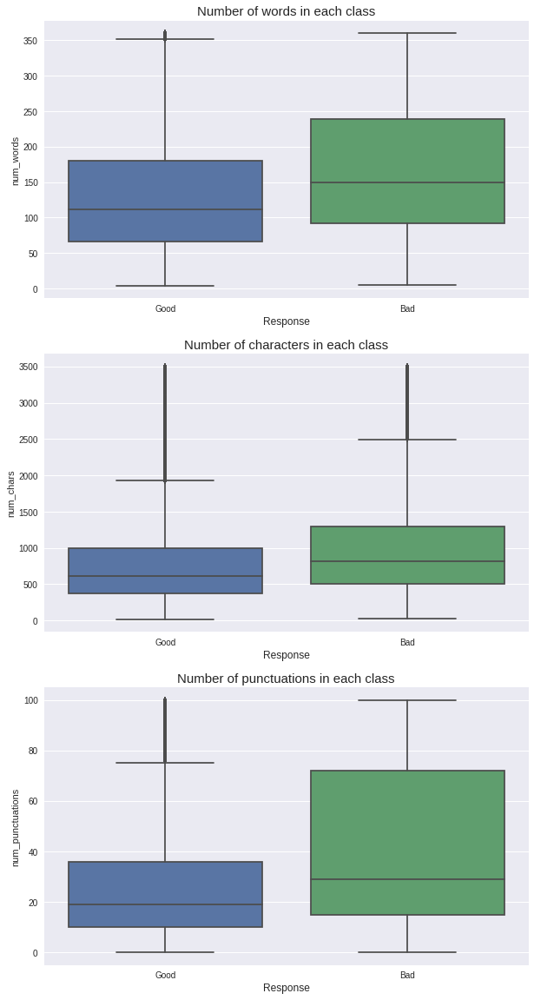

In [28]:
## Truncate some extreme values for better visuals ##
train['num_words'].loc[train['num_words']>360] = 360 #truncation for better visuals
train['num_punctuations'].loc[train['num_punctuations']>100] = 100 #truncation for better visuals
train['num_chars'].loc[train['num_chars']>3500] = 3500 #truncation for better visuals

f, axes = plt.subplots(3, 1, figsize=(10,20))
sns.boxplot(x='is_response', y='num_words', data=train, ax=axes[0])
axes[0].set_xlabel('Response', fontsize=12)
axes[0].set_title("Number of words in each class", fontsize=15)

sns.boxplot(x='is_response', y='num_chars', data=train, ax=axes[1])
axes[1].set_xlabel('Response', fontsize=12)
axes[1].set_title("Number of characters in each class", fontsize=15)

sns.boxplot(x='is_response', y='num_punctuations', data=train, ax=axes[2])
axes[2].set_xlabel('Response', fontsize=12)
#plt.ylabel('Number of punctuations in text', fontsize=12)
axes[2].set_title("Number of punctuations in each class", fontsize=15)
plt.show()

#### Inference:

We can see that the Bad response have more number of words as well as characters compared to Good Response. So this might be a useful feature in our model.

### Let us build the base model-Logistic Regression model with TFIDF

In [0]:
from sklearn import model_selection, preprocessing, metrics, ensemble, naive_bayes, linear_model
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

pd.options.mode.chained_assignment = None
pd.options.display.max_columns = 999

In [0]:
# Get the tfidf vectors #
tfidf_vec = TfidfVectorizer(stop_words='english', ngram_range=(1,3))
tfidf_vec.fit_transform(train['description'].values.tolist() + test['description'].values.tolist())
train_tfidf = tfidf_vec.transform(train['description'].values.tolist())
test_tfidf = tfidf_vec.transform(test['description'].values.tolist())

In [0]:
#Label encoding
le=preprocessing.LabelEncoder()

train['browser_used']=le.fit_transform(train.browser_used)
train['device_used']=le.fit_transform(train.device_used)
train['is_response']=le.fit_transform(train.is_response)

In [32]:
train_tfidf.data.shape,train.shape

((5862332,), (30172, 13))

In [33]:
train_y = train["is_response"].values
train_x=train.drop(["is_response","user_id","description"],1).values

def runModel(train_X, train_y, test_X, test_y, test_X2):
    model = linear_model.LogisticRegression(C=5., solver='newton-cg')
    model.fit(train_X, train_y)
    pred_test_y = model.predict_proba(test_X)[:,1]
    pred_test_y2 = model.predict_proba(test_X2)[:,1]
    return pred_test_y, pred_test_y2, model

print("Building model.")
cv_scores = []
pred_full_test = 0
pred_train = np.zeros([train.shape[0]])
kf = model_selection.KFold(n_splits=5, shuffle=True, random_state=42)
for dev_index, val_index in kf.split(train):
    dev_X, val_X =train_tfidf[dev_index],train_tfidf[val_index]
    dev_y, val_y = train_y[dev_index], train_y[val_index]
    pred_val_y, pred_test_y, model = runModel(dev_X, dev_y, val_X, val_y, test_tfidf)
    pred_full_test = pred_full_test + pred_test_y
    pred_train[val_index] = pred_val_y
    cv_scores.append(metrics.log_loss(val_y, pred_val_y))
    break

Building model.


At threshold 0.4 F1 score: 0.8977438545291279, Accurcay:0.8490472245236123
At threshold 0.42 F1 score: 0.9010169491525423, Accurcay:0.8548467274233638
At threshold 0.44 F1 score: 0.9025664319781966, Accurcay:0.8578293289146645
At threshold 0.46 F1 score: 0.9059105979192866, Accurcay:0.8636288318144159
At threshold 0.48 F1 score: 0.9086306098964327, Accurcay:0.868434134217067
At threshold 0.5 F1 score: 0.9103544127866575, Accurcay:0.871748135874068
At threshold 0.52 F1 score: 0.9118470149253731, Accurcay:0.8747307373653687
At threshold 0.54 F1 score: 0.9125073399882561, Accurcay:0.8765534382767192
At threshold 0.56 F1 score: 0.9133522727272728, Accurcay:0.8787075393537697
At threshold 0.58 F1 score: 0.913412158127314, Accurcay:0.87986743993372
At threshold 0.6 F1 score: 0.9132683748345963, Accurcay:0.8805302402651202
At threshold 0.62 F1 score: 0.9134335596508244, Accurcay:0.8816901408450705
At threshold 0.64 F1 score: 0.9111600587371512, Accurcay:0.87970173985087
At threshold 0.66 F1 s

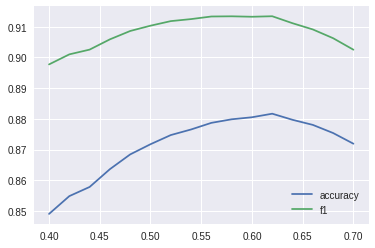

In [34]:
threshold,accuracy,f1=[],[],[]

for thresh in np.arange(0.4, 0.701, 0.02):
    thresh = np.round(thresh, 2)
    print("At threshold {0} F1 score: {1}, Accurcay:{2}".format(thresh, 
                                                                     metrics.f1_score(val_y, (pred_val_y>thresh).astype(int)),
                                                                    metrics.accuracy_score(val_y,(pred_val_y>thresh).astype(int))))         
    threshold.append(thresh)
    accuracy.append(metrics.accuracy_score(val_y,(pred_val_y>thresh).astype(int)))
    f1.append(metrics.f1_score(val_y, (pred_val_y>thresh).astype(int)))
    
plt.plot(threshold,accuracy,threshold,f1)
plt.legend(['accuracy','f1'])
plt.show()

#### We are getting highest accuracy(88.15%) and f1 (91.33%) score at threshold 0.62

In [35]:
pred_test_y

array([0.30266955, 0.77609655, 0.95547209, ..., 0.92895346, 0.64759645,
       0.61268811])

In [0]:
del model
import gc; gc.collect()
import time;time.sleep(10)

## Embedding and LSTM model

In [0]:
from tensorflow.python.keras.preprocessing.text import Tokenizer
from tensorflow.python.keras.preprocessing.sequence import pad_sequences
from tensorflow.python.keras.layers import Dense, Input, LSTM, Embedding, Dropout, Activation, Conv1D,CuDNNGRU
from tensorflow.python.keras.layers import Bidirectional, GlobalMaxPool1D
from tensorflow.python.keras.models import Model,Sequential,load_model
from tensorflow.python.keras import initializers, regularizers, constraints, optimizers, layers

In [0]:
## split to train and val
train_df, val_df = model_selection.train_test_split(train, test_size=0.1, random_state=2018)

## some config values 
embed_size = 300 # how big is each word vector
max_features = 50000 # how many unique words to use (i.e num rows in embedding vector)
maxlen = 100 # max number of words in_response to use

## fill up the missing values
train_X = train_df["description"].fillna("_na_").values
val_X = val_df["description"].fillna("_na_").values
test_X = test["description"].fillna("_na_").values

## Tokenize the sentences
tokenizer = Tokenizer(num_words=max_features)
tokenizer.fit_on_texts(list(train_X))
train_X = tokenizer.texts_to_sequences(train_X)
val_X = tokenizer.texts_to_sequences(val_X)
test_X = tokenizer.texts_to_sequences(test_X)

## Pad the sentences 
train_X = pad_sequences(train_X, maxlen=maxlen)
val_X = pad_sequences(val_X, maxlen=maxlen)
test_X = pad_sequences(test_X, maxlen=maxlen)

## Get the target values
train_y = train_df['is_response'].values
val_y = val_df['is_response'].values

### Model Building

In [39]:
inp = Input(shape=(maxlen,))
x = Embedding(max_features, embed_size)(inp)
x = Bidirectional(CuDNNGRU(128, return_sequences=True))(x)
#x = LSTM(64, return_sequences=True)(x)
x = GlobalMaxPool1D()(x)
x = Dense(16, activation="relu")(x)
x = Dropout(rate=0.1)(x)
x = Dense(1, activation="sigmoid")(x)
model = Model(inputs=inp, outputs=x)
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

print(model.summary())

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 100)               0         
_________________________________________________________________
embedding (Embedding)        (None, 100, 300)          15000000  
_________________________________________________________________
bidirectional (Bidirectional (None, 100, 256)          330240    
_________________________________________________________________
global_max_pooling1d (Global (None, 256)               0         
_________________________________________________________________
dense (Dense)                (None, 16)                4112      
_________________________________________________________________
dropout (Dropout)    

In [40]:
## Train the model 
model.fit(train_X, train_y, batch_size=64, epochs=2, validation_data=(val_X, val_y))

Train on 27154 samples, validate on 3018 samples
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
Epoch 1/2
27154/27154 [==============================] - 28s 1ms/sample - loss: 0.4035 - acc: 0.8148 - val_loss: 0.3095 - val_acc: 0.8731
Epoch 2/2
27154/27154 [==============================] - 25s 927us/sample - loss: 0.2674 - acc: 0.8909 - val_loss: 0.3016 - val_acc: 0.8744


**There is an improvement from 88.16% to 88.70% in validation accuracy**

In [0]:
model.save('emb_desc_model.h5')

3018/3018 [==============================] - 1s 203us/sample
At threshold 0.3 F1 score: 0.9052295044530715, Accurcay:0.8624917163684559
At threshold 0.32 F1 score: 0.9042479908151551, Accurcay:0.8618290258449304
At threshold 0.34 F1 score: 0.9056081237018232, Accurcay:0.8644797879390325
At threshold 0.36 F1 score: 0.907446068197634, Accurcay:0.8677932405566601
At threshold 0.38 F1 score: 0.9081156716417911, Accurcay:0.8694499668654738
At threshold 0.4 F1 score: 0.9072987561605257, Accurcay:0.8691186216037111
At threshold 0.42 F1 score: 0.9085768143261074, Accurcay:0.8714380384360504
At threshold 0.44 F1 score: 0.9094776648546443, Accurcay:0.8730947647448641
At threshold 0.46 F1 score: 0.908616187989556, Accurcay:0.8724320742213386
At threshold 0.48 F1 score: 0.9088740458015266, Accurcay:0.873426110006627
At threshold 0.5 F1 score: 0.9092215568862276, Accurcay:0.8744201457919152
At threshold 0.52 F1 score: 0.908433734939759, Accurcay:0.8740888005301524
At threshold 0.54 F1 score: 0.9069

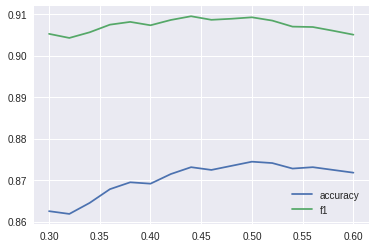

In [42]:
pred_noemb_val_y = model.predict([val_X], batch_size=128, verbose=1)
threshold,accuracy,f1=[],[],[]

for thresh in np.arange(0.3, 0.601, 0.02):
    thresh = np.round(thresh, 2)
   # print("F1 score at threshold {0} is {1}".format(thresh, metrics.f1_score(val_y, (pred_noemb_val_y>thresh).astype(int))))
   # print("Accuracy score at threshold {0} is {1}".format(thresh, metrics.accuracy_score(val_y, (pred_noemb_val_y>thresh).astype(int))))
    
    print("At threshold {0} F1 score: {1}, Accurcay:{2}".format(thresh,metrics.f1_score(val_y, (pred_noemb_val_y>thresh).astype(int)),
                                                                metrics.accuracy_score(val_y,(pred_noemb_val_y>thresh).astype(int))))   
                                                                   
    threshold.append(thresh)
    accuracy.append(metrics.accuracy_score(val_y,(pred_noemb_val_y>thresh).astype(int)))
    f1.append(metrics.f1_score(val_y, (pred_noemb_val_y>thresh).astype(int)))
    
plt.plot(threshold,accuracy,threshold,f1)
plt.legend(['accuracy','f1'])
plt.show()


**Accuracy is highest as 0.46 threshold, but f1 score is highest at 0.34 threshold**

In [0]:
del model, inp, x
import gc; gc.collect()
time.sleep(10)

In [58]:
!ls

antworks_assignment  antworks_assignment.zip  emb_desc_model.h5  sample_data


In [0]:
#load the model
model=load_model('emb_desc_model.h5')

In [61]:
#predict on test data
pred_noemb_test_y = model.predict([test_X], batch_size=128, verbose=1)

8760/8760 [==============================] - 10s 1ms/sample


In [101]:
#submission file
df=pd.DataFrame([np.array(test.user_id),np.where(pred_noemb_test_y>.46,'Good','Bad')]).T
df.columns=['User_ID','Is_Response']
df.to_csv('submission_no_embedding.csv',sep='~',columns=['User_ID','Is_Response'])
df.head()

,User_ID,Is_Response
0,9602,[Bad]
1,8749,[Good]
2,15500,[Good]
3,5495,[Good]
4,18570,[Good]


In [94]:
!ls

antworks_assignment	 emb_desc_model.h5  submission_no_embedding.csv
antworks_assignment.zip  sample_data


In [0]:
#download the model and submission file
from google.colab import files
files.download('submission_no_embedding.csv')
files.download('emb_desc_model.h5')

### Let us try taking embedding from Stanford GloVe and perform the simlar model

Common Crawl (840B tokens, 2.2M vocab, cased, 300d vectors, 2.03 GB download): glove.840B.300d.zip

In [17]:
#download
!wget --header="Host: nlp.stanford.edu" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/72.0.3626.121 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8" --header="Accept-Language: en-GB,en-US;q=0.9,en;q=0.8" --header="Cookie: _ga=GA1.2.1241972586.1537373339; _mkto_trk=id:194-OCQ-487&token:_mch-stanford.edu-1544634469490-61996; clickThrough=1; _gid=GA1.2.1998958900.1552225087" --header="Connection: keep-alive" "https://nlp.stanford.edu/data/glove.840B.300d.zip" -O "glove.840B.300d.zip" -c

--2019-03-10 14:26:47--  https://nlp.stanford.edu/data/glove.840B.300d.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2176768927 (2.0G) [application/zip]
Saving to: ‘glove.840B.300d.zip’

glove.840B.300d.zip 100%[===================>]   2.03G  14.7MB/s    in 1m 57s  

2019-03-10 14:28:44 (17.7 MB/s) - ‘glove.840B.300d.zip’ saved [2176768927/2176768927]



In [18]:
!unzip glove.840B.300d.zip

Archive:  glove.840B.300d.zip
  inflating: glove.840B.300d.txt     


In [46]:
!ls

antworks_assignment	 emb_desc_model.h5    glove.840B.300d.zip
antworks_assignment.zip  glove.840B.300d.txt  sample_data


In [19]:
EMBEDDING_FILE = 'glove.840B.300d.txt'
def get_coefs(word,*arr): return word, np.asarray(arr, dtype='float32')
embeddings_index = dict(get_coefs(*o.split(" ")) for o in open(EMBEDDING_FILE))

all_embs = np.stack(embeddings_index.values())
emb_mean,emb_std = all_embs.mean(), all_embs.std()
embed_size = all_embs.shape[1]

word_index = tokenizer.word_index
nb_words = max(max_features, len(word_index))
embedding_matrix = np.random.normal(emb_mean, emb_std, (nb_words, embed_size))
for word, i in word_index.items():
    if i >= max_features: continue
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None: embedding_matrix[i] = embedding_vector
        
inp = Input(shape=(maxlen,))
x = Embedding(max_features, embed_size, weights=[embedding_matrix])(inp)
x = Bidirectional(CuDNNGRU(64, return_sequences=True))(x)
x = GlobalMaxPool1D()(x)
x = Dense(16, activation="relu")(x)
x = Dropout(0.1)(x)
x = Dense(1, activation="sigmoid")(x)
model = Model(inputs=inp, outputs=x)
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 100)               0         
_________________________________________________________________
embedding (Embedding)        (None, 100, 300)          15000000  
_________________________________________________________________
bidirectional (Bidirectional (None, 100, 128)          140544    
_________________________________________________________________
global_max_pooling1d (Global (None, 128)               0         
_________________________________________________________________
dense (Dense)                (None, 16)                2064      
_________________________________________________________________
dropout (Dropout)    

In [49]:
nb_words

42490

In [26]:
model.fit(train_X, train_y, batch_size=64, epochs=2, validation_data=(val_X, val_y))

Train on 27154 samples, validate on 3018 samples
Epoch 1/2
27154/27154 [==============================] - 21s 787us/sample - loss: 0.1968 - acc: 0.9273 - val_loss: 0.3034 - val_acc: 0.8734
Epoch 2/2
27154/27154 [==============================] - 21s 779us/sample - loss: 0.1116 - acc: 0.9628 - val_loss: 0.3860 - val_acc: 0.8645


3018/3018 [==============================] - 1s 230us/sample
At threshold 0.3 F1 score: 0.9022975168252495, Accurcay:0.8605036447978794
At threshold 0.32 F1 score: 0.9038864323946941, Accurcay:0.8631544068919814
At threshold 0.34 F1 score: 0.9048507462686567, Accurcay:0.8648111332007953
At threshold 0.36 F1 score: 0.9050514499532274, Accurcay:0.8654738237243207
At threshold 0.38 F1 score: 0.9050855401921726, Accurcay:0.8658051689860835
At threshold 0.4 F1 score: 0.9058906360009388, Accurcay:0.8671305500331346
At threshold 0.42 F1 score: 0.9056692542931075, Accurcay:0.8671305500331346
At threshold 0.44 F1 score: 0.9045036547983966, Accurcay:0.8658051689860835
At threshold 0.46 F1 score: 0.9043683589138135, Accurcay:0.8658051689860835
At threshold 0.48 F1 score: 0.9033633349123639, Accurcay:0.8648111332007953
At threshold 0.5 F1 score: 0.9029655990510084, Accurcay:0.8644797879390325
At threshold 0.52 F1 score: 0.9027348394768132, Accurcay:0.8644797879390325
At threshold 0.54 F1 score: 0.

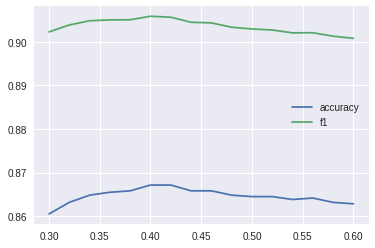

In [29]:
pred_glove_val_y = model.predict([val_X], batch_size=64, verbose=1)

threshold,accuracy,f1=[],[],[]

for thresh in np.arange(0.3, 0.601, 0.02):
    thresh = np.round(thresh, 2)
   # print("F1 score at threshold {0} is {1}".format(thresh, metrics.f1_score(val_y, (pred_noemb_val_y>thresh).astype(int))))
   # print("Accuracy score at threshold {0} is {1}".format(thresh, metrics.accuracy_score(val_y, (pred_noemb_val_y>thresh).astype(int))))
    
    print("At threshold {0} F1 score: {1}, Accurcay:{2}".format(thresh,metrics.f1_score(val_y, (pred_glove_val_y>thresh).astype(int)),
                                                                metrics.accuracy_score(val_y,(pred_glove_val_y>thresh).astype(int))))   
                                                                   
    threshold.append(thresh)
    accuracy.append(metrics.accuracy_score(val_y,(pred_glove_val_y>thresh).astype(int)))
    f1.append(metrics.f1_score(val_y, (pred_glove_val_y>thresh).astype(int)))
    
plt.plot(threshold,accuracy,threshold,f1)
plt.legend(['accuracy','f1'])
plt.show()

In [0]:
model.save('Glove_emb_dec_model.h5')

In [27]:
pred_glove_test_y = model.predict([test_X], batch_size=128, verbose=1)

8760/8760 [==============================] - 1s 134us/sample


In [25]:
from google.colab import files
files.download('Glove_emb_dec_model.h5')

----------------------------------------
Exception happened during processing of request from ('::ffff:127.0.0.1', 60618, 0, 0)
Traceback (most recent call last):
  File "/usr/lib/python3.6/socketserver.py", line 317, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 348, in process_request
    self.finish_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 361, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/usr/lib/python3.6/socketserver.py", line 721, in __init__
    self.handle()
  File "/usr/lib/python3.6/http/server.py", line 418, in handle
    self.handle_one_request()
  File "/usr/lib/python3.6/http/server.py", line 406, in handle_one_request
    method()
  File "/usr/lib/python3.6/http/server.py", line 639, in do_GET
    self.copyfile(f, self.wfile)
  File "/usr/lib/python3.6/http/server.py", line 800, in copyfile
    shutil.copyfil

In [0]:
!kill -9 -1